
## Overview

This notebook will show you how to create and query a table or DataFrame that you uploaded to DBFS. [DBFS](https://docs.databricks.com/user-guide/dbfs-databricks-file-system.html) is a Databricks File System that allows you to store data for querying inside of Databricks. This notebook assumes that you have a file already inside of DBFS that you would like to read from.

This notebook is written in **Python** so the default cell type is Python. However, you can use different languages by using the `%LANGUAGE` syntax. Python, Scala, SQL, and R are all supported.

In [0]:
# File location and type
file_location = "/FileStore/tables/yellow_taxi_csv_updated.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
1,7/1/2021 0:30,7/1/2021 0:35,N,1,74,168,1,1.2,6.0,0.5,0.5,0.0,0.0,null,0.3,7.3,2,1,0.0
2,7/1/2021 0:25,7/1/2021 1:01,N,1,116,265,2,13.69,42.0,0.5,0.5,0.0,0.0,null,0.3,43.3,2,1,0.0
2,7/1/2021 0:05,7/1/2021 0:12,N,1,97,33,1,0.95,6.5,0.5,0.5,2.34,0.0,null,0.3,10.14,1,1,0.0
2,7/1/2021 0:41,7/1/2021 0:47,N,1,74,42,1,1.24,6.5,0.5,0.5,0.0,0.0,null,0.3,7.8,2,1,0.0
2,7/1/2021 0:51,7/1/2021 0:58,N,1,42,244,1,1.1,7.0,0.5,0.5,0.0,0.0,null,0.3,8.3,2,1,0.0
1,7/1/2021 0:05,7/1/2021 0:11,N,1,24,239,1,1.9,8.0,3.25,0.5,3.0,0.0,null,0.3,15.05,1,1,2.75
2,7/1/2021 0:57,7/1/2021 1:27,N,1,75,243,1,0.0,17.5,0.5,0.5,0.0,0.0,null,0.3,18.8,2,1,0.0
2,7/1/2021 0:27,7/1/2021 0:32,N,1,82,82,1,0.66,5.0,0.5,0.5,0.0,0.0,null,0.3,6.3,2,1,0.0
2,7/1/2021 0:29,7/1/2021 0:34,N,1,74,42,1,1.72,7.0,0.5,0.5,2.08,0.0,null,0.3,10.38,1,1,0.0
2,7/1/2021 0:41,7/1/2021 0:49,N,1,41,42,1,1.37,7.5,0.5,0.5,0.0,0.0,null,0.3,8.8,2,1,0.0


In [0]:
import pyspark.sql.functions as f

# Assuming your DataFrame is named 'df' and the column with the date and time information is named 'lpep_pickup_datetime'
df1 = df.withColumn("datetime", f.to_timestamp("lpep_pickup_datetime", "M/d/yyyy H:mm"))\
        .withColumn("month_str",f.date_format("datetime","MMMM"))\
        .withColumn("month_num", f.month("datetime"))\
        .withColumn("week_str",f.date_format("datetime","EEEE"))\
        .withColumn("week_num",f.dayofweek("datetime"))       
# Now, you can extract the year and month from the timestamp column as follows:

        
df1.display()


VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,datetime,month_str,month_num,week_str,week_num
1,7/1/2021 0:30,7/1/2021 0:35,N,1,74,168,1,1.2,6.0,0.5,0.5,0.0,0.0,null,0.3,7.3,2,1,0.0,2021-07-01T00:30:00.000+0000,July,7,Thursday,5
2,7/1/2021 0:25,7/1/2021 1:01,N,1,116,265,2,13.69,42.0,0.5,0.5,0.0,0.0,null,0.3,43.3,2,1,0.0,2021-07-01T00:25:00.000+0000,July,7,Thursday,5
2,7/1/2021 0:05,7/1/2021 0:12,N,1,97,33,1,0.95,6.5,0.5,0.5,2.34,0.0,null,0.3,10.14,1,1,0.0,2021-07-01T00:05:00.000+0000,July,7,Thursday,5
2,7/1/2021 0:41,7/1/2021 0:47,N,1,74,42,1,1.24,6.5,0.5,0.5,0.0,0.0,null,0.3,7.8,2,1,0.0,2021-07-01T00:41:00.000+0000,July,7,Thursday,5
2,7/1/2021 0:51,7/1/2021 0:58,N,1,42,244,1,1.1,7.0,0.5,0.5,0.0,0.0,null,0.3,8.3,2,1,0.0,2021-07-01T00:51:00.000+0000,July,7,Thursday,5
1,7/1/2021 0:05,7/1/2021 0:11,N,1,24,239,1,1.9,8.0,3.25,0.5,3.0,0.0,null,0.3,15.05,1,1,2.75,2021-07-01T00:05:00.000+0000,July,7,Thursday,5
2,7/1/2021 0:57,7/1/2021 1:27,N,1,75,243,1,0.0,17.5,0.5,0.5,0.0,0.0,null,0.3,18.8,2,1,0.0,2021-07-01T00:57:00.000+0000,July,7,Thursday,5
2,7/1/2021 0:27,7/1/2021 0:32,N,1,82,82,1,0.66,5.0,0.5,0.5,0.0,0.0,null,0.3,6.3,2,1,0.0,2021-07-01T00:27:00.000+0000,July,7,Thursday,5
2,7/1/2021 0:29,7/1/2021 0:34,N,1,74,42,1,1.72,7.0,0.5,0.5,2.08,0.0,null,0.3,10.38,1,1,0.0,2021-07-01T00:29:00.000+0000,July,7,Thursday,5
2,7/1/2021 0:41,7/1/2021 0:49,N,1,41,42,1,1.37,7.5,0.5,0.5,0.0,0.0,null,0.3,8.8,2,1,0.0,2021-07-01T00:41:00.000+0000,July,7,Thursday,5


###Pair Task 1 (Sumedh & Amol)
###Calculate the average trip distance for each day of the week, considering only trips longer than 5 miles.

In [0]:
require_df = df1.filter(f.col("trip_distance")> 5)
require_df = require_df.groupBy('week_str').agg(f.avg("trip_distance"))
require_df.display()

week_str,avg(trip_distance)
Wednesday,640.2946326587212
Tuesday,626.712053703158
Friday,489.53492799279763
Thursday,607.2014800967671
Saturday,664.0988516746431
Monday,776.3128575929427
Sunday,639.6831935975616


#### Pair Task 2 (Sumedh & Amol)
####Find the average fare amount per trip type (e.g., street-hail, dispatch) for trips longer than 10 miles, excluding trips with zero fare

In [0]:
from pyspark.sql.functions import col, avg

# Filter trips longer than 10 miles and with non-zero fare
filtered_df = df1.filter((col("trip_distance") > 10) & (col("fare_amount") > 0) & (col("trip_type") > 0))

# Group by trip type and calculate the average fare amount
average_fare_per_trip_type = filtered_df.groupBy("trip_type").agg(avg("fare_amount").alias("avg_fare_amount"))

# Show the result
average_fare_per_trip_type.show()

+---------+-----------------+
|trip_type|  avg_fare_amount|
+---------+-----------------+
|        1|55.86734341906203|
|        2|61.52459183673469|
+---------+-----------------+



Visualization Task : Visualize the distribution of trip distances for each day of the week.

Expected steps:

•	S1 : Aggregate data to calculate the total trip distance for each day of the week                                                                                          
•	S2 : Normalize the trip distances for each day of the week.                                                                                                                      
•	S3 : Plot the normalized trip distances for each day of the week as a line chart                                                                                                


In [0]:
#  Step 1 : Aggregate data to calculate the total trip distance for each day of the week

required_df = df1.groupBy("week_str","week_num").agg(f.round(f.sum("trip_distance"),2).alias('total_distance')).orderBy("week_num")
required_df.display()

week_str,week_num,total_distance
Sunday,1,1689488.46
Monday,2,2478584.73
Tuesday,3,2138841.5
Wednesday,4,2325774.84
Thursday,5,2781502.18
Friday,6,2196491.86
Saturday,7,2655055.57


In [0]:
max_value=required_df.agg(f.max('total_distance')).collect()[0][0]
print(max_value)

2781502.18


In [0]:
# • Step 2 : Normalize the trip distances for each day of the week.

required_df=required_df.withColumn("Normalized_Distance",f.round(f.col("total_distance")/max_value,2))
required_df.display()

week_str,week_num,total_distance,Normalized_Distance
Sunday,1,1689488.46,0.61
Monday,2,2478584.73,0.89
Tuesday,3,2138841.5,0.77
Wednesday,4,2325774.84,0.84
Thursday,5,2781502.18,1.0
Friday,6,2196491.86,0.79
Saturday,7,2655055.57,0.95


In [0]:

# Assuming required_df is your DataFrame and max_value is the maximum value from the "total_distance" column
required_df = required_df.withColumn("normalized_distance", f.round(f.col("total_distance") / max_value,3))

# Display the resulting DataFrame
required_df.display()


week_str,week_num,total_distance,normalized_distance
Sunday,1,1689488.46,0.607
Monday,2,2478584.73,0.891
Tuesday,3,2138841.5,0.769
Wednesday,4,2325774.84,0.836
Thursday,5,2781502.18,1.0
Friday,6,2196491.86,0.79
Saturday,7,2655055.57,0.955


In [0]:
required_df = required_df[['week_str','normalized_distance']]
required_df.display()

week_str,normalized_distance
Sunday,0.607
Monday,0.891
Tuesday,0.769
Wednesday,0.836
Thursday,1.0
Friday,0.79
Saturday,0.955


In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
required_pandas_df =required_df.withColumnRenamed("week_str","day").withColumnRenamed("normalized_distance","distance").toPandas()
required_pandas_df.display() 

day,distance
Sunday,0.607
Monday,0.891
Tuesday,0.769
Wednesday,0.836
Thursday,1.0
Friday,0.79
Saturday,0.955


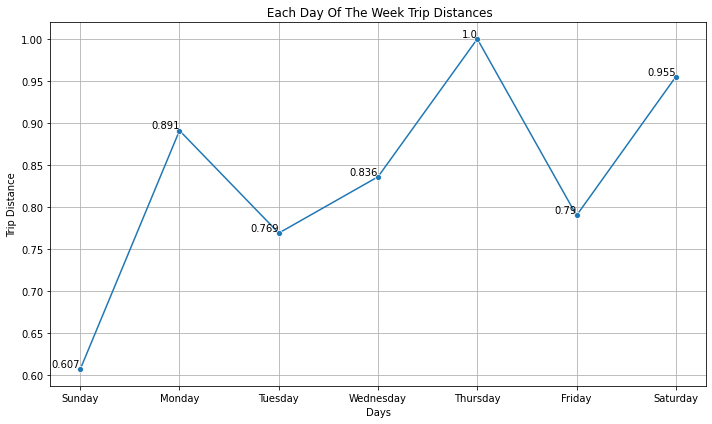

In [0]:
#  Step 3 : Plot the normalized trip distances for each day of the week as a line chart

plt.figure(figsize=(10, 6))
sns.lineplot(x='day', y='distance', data=required_pandas_df, marker='o')
plt.title(' Each Day Of The Week Trip Distances')
plt.xlabel('Days')
plt.ylabel('Trip Distance')
 
for index, row in required_pandas_df.iterrows():
    plt.text(row['day'], row['distance'], str(row['distance']), ha='right', va='bottom')
 
plt.grid(True)
 
plt.tight_layout()
plt.show()

###Analysis of the weekly analysis line chart
#####1) The weekely data analysis shows that the peak business day in Thursday with the huggest commute distance of (1 unit) followed by Saturday(0.955)
#####2) The least distance travelled is on Saturday which might be because of the weekely off